**LSGAN** are similar to DCGANs in architecture however they have MSEloss instead of BCEloss

In [2]:
import numpy as np 
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.nn.parallel as parallel
import torch.optim as optim
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import argparse
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torch.backends.cudnn as cudnn

# Observing an example image to decide size and channels

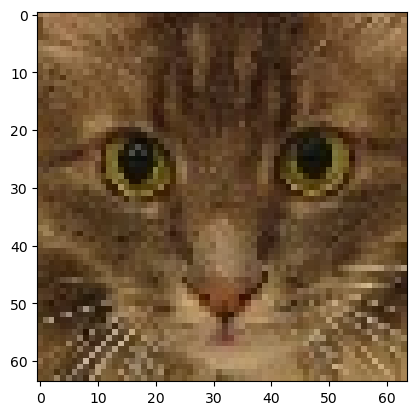

In [3]:
import cv2
example=cv2.imread('/kaggle/input/cats-faces-64x64-for-generative-models/cats/10020.jpg')
example = cv2.cvtColor(example, cv2.COLOR_BGR2RGB)
plt.imshow(example)

In [4]:
example.shape

(64, 64, 3)

# Setting Variables

In [97]:
dataroot='/kaggle/input/cats-faces-64x64-for-generative-models/cats'
num_workers=2
batch_size=128
image_size=64
nc=3
nz=100
#Feature maps in generator and discriminator
ngf=64
ndf=64
num_epochs=50
lr=0.0001
beta1=0.5

-A feature map is the output of a convolutional layer representing specific features in the input image or feature map. A value of 64 for ngf and ndf is a common choice and often works well for many image generation tasks.

-The dimensionality of the latent space should be chosen based on the complexity of the data and the level of abstraction you want to capture. Higher-dimensional latent spaces can potentially capture more intricate details but may also lead to increased computational complexity. Conversely, lower-dimensional latent spaces may result in a loss of finer details but can offer faster processing.

In [6]:
dataset = dset.ImageFolder(root=dataroot,transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)),
]))
dataloader=torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True,num_workers=num_workers)

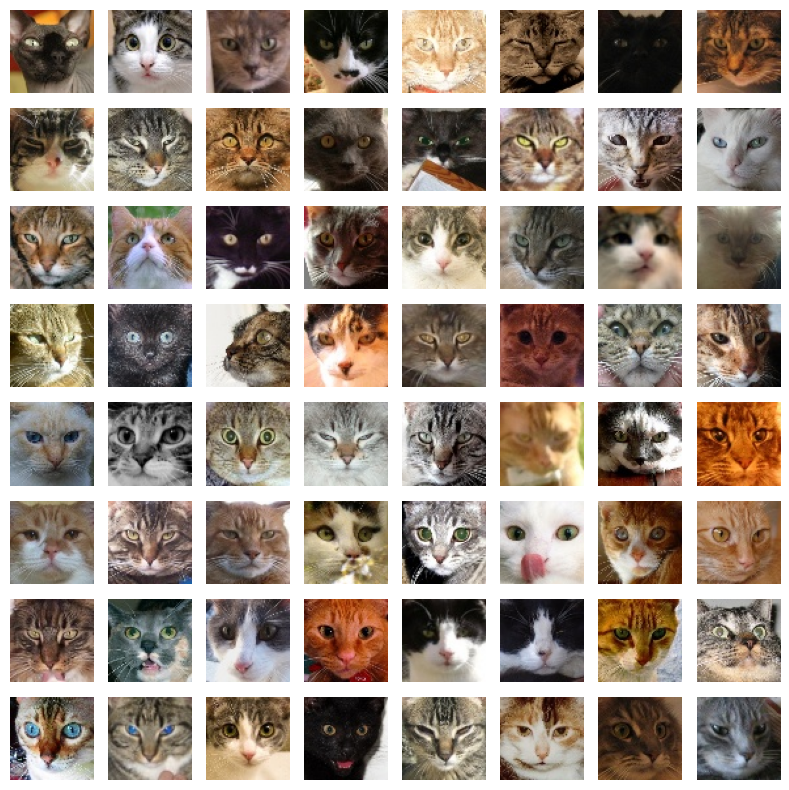

In [7]:
# Get a batch of images from the dataloader
images, _ = next(iter(dataloader))

# Reshape the batch of images
images = images.view(batch_size, 3, image_size, image_size)

# Create a grid of 8x8 subplots
fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(8, 8))

# Iterate through the subplots and display the images
for i, ax in enumerate(axes.flat):
    ax.imshow((images[i].permute(1, 2, 0) + 1) / 2)  # Convert back to range [0, 1]
    ax.axis('off')

# Show the grid of images
plt.tight_layout()
plt.show()


In [76]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


If the classname contains the substring 'Conv', it means the module is a convolutional layer. In this case, the weights of the convolutional layer are initialized using a normal distribution with a mean of 0.0 and a standard deviation of 0.02. This is done using the nn.init.normal_ function, which assigns random values drawn from the specified normal distribution to the weight.data attribute of the module.

If the classname contains the substring 'BatchNorm', it means the module is a batch normalization layer. Batch normalization layers have two learnable parameters: weight and bias. In this case, the weight parameter is initialized using a normal distribution with a mean of 1.0 and a standard deviation of 0.02, and the bias parameter is initialized to a constant value of 0. This is done using the nn.init.normal_ and nn.init.constant_ functions, which assign the specified values to the weight.data and bias.data attributes of the module, respectively.

By applying this weight initialization function to the modules of a neural network, you ensure that the initial weights are set to reasonable values that can help with the stability and convergence of the training process. Initializing the weights in a controlled manner can improve the performance and effectiveness of the network during training.

In [123]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [124]:
netG = Generator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [125]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [126]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [129]:
# Initialize the ``BCELoss`` function
criterion = nn.MSELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [130]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Reshape output to match label size
        output = output.view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Reshape output to match label size
        output = output.view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Reshape output to match label size
        output = output.view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1


Starting Training Loop...
[0/50][0/124]	Loss_D: 0.0618	Loss_G: 0.1647	D(x): 0.8280	D(G(z)): 0.0386 / 0.6703
[0/50][50/124]	Loss_D: 0.0857	Loss_G: 0.7721	D(x): 0.7952	D(G(z)): 0.0317 / 0.1337
[0/50][100/124]	Loss_D: 0.0750	Loss_G: 0.9060	D(x): 0.9524	D(G(z)): 0.1742 / 0.0508
[1/50][0/124]	Loss_D: 0.1010	Loss_G: 0.7312	D(x): 0.7949	D(G(z)): 0.0317 / 0.1601
[1/50][50/124]	Loss_D: 0.1886	Loss_G: 0.9854	D(x): 0.9593	D(G(z)): 0.3518 / 0.0074
[1/50][100/124]	Loss_D: 0.4651	Loss_G: 0.9178	D(x): 0.3650	D(G(z)): 0.0012 / 0.0449
[2/50][0/124]	Loss_D: 0.3418	Loss_G: 0.9606	D(x): 0.9395	D(G(z)): 0.4915 / 0.0247
[2/50][50/124]	Loss_D: 0.2707	Loss_G: 0.9918	D(x): 0.9337	D(G(z)): 0.4455 / 0.0041
[2/50][100/124]	Loss_D: 0.0880	Loss_G: 0.9399	D(x): 0.8888	D(G(z)): 0.1882 / 0.0312
[3/50][0/124]	Loss_D: 0.0872	Loss_G: 0.9322	D(x): 0.9050	D(G(z)): 0.1792 / 0.0354
[3/50][50/124]	Loss_D: 0.0798	Loss_G: 0.8005	D(x): 0.7988	D(G(z)): 0.0637 / 0.1120
[3/50][100/124]	Loss_D: 0.0596	Loss_G: 0.9093	D(x): 0.8680	D(G

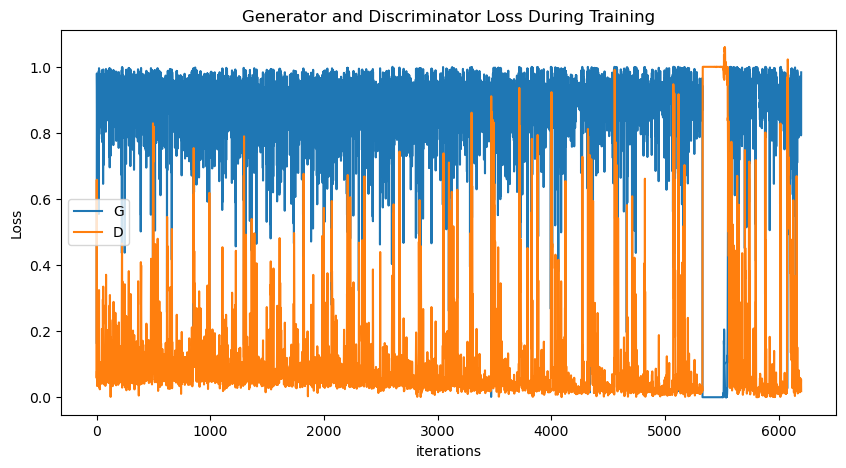

In [131]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Our losses are fluctuating and not converging effectively So our model might require imporvements...

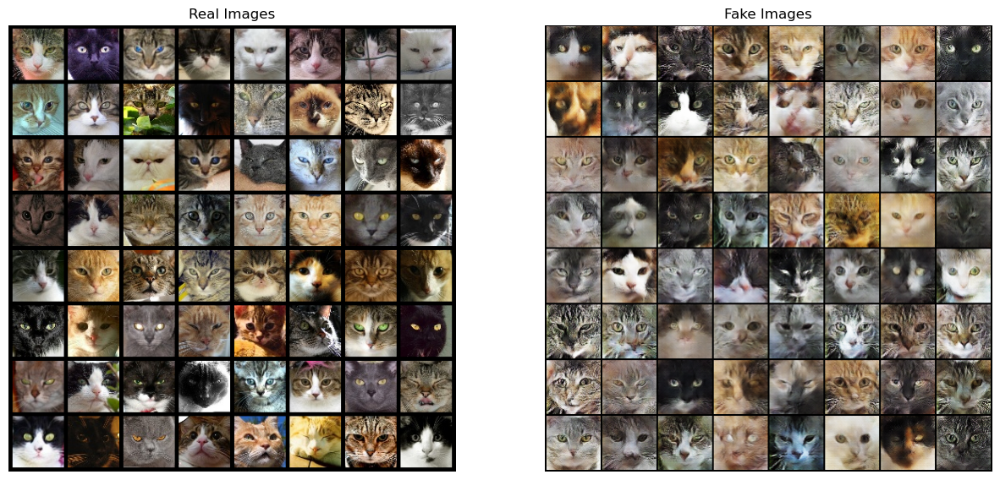

In [133]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

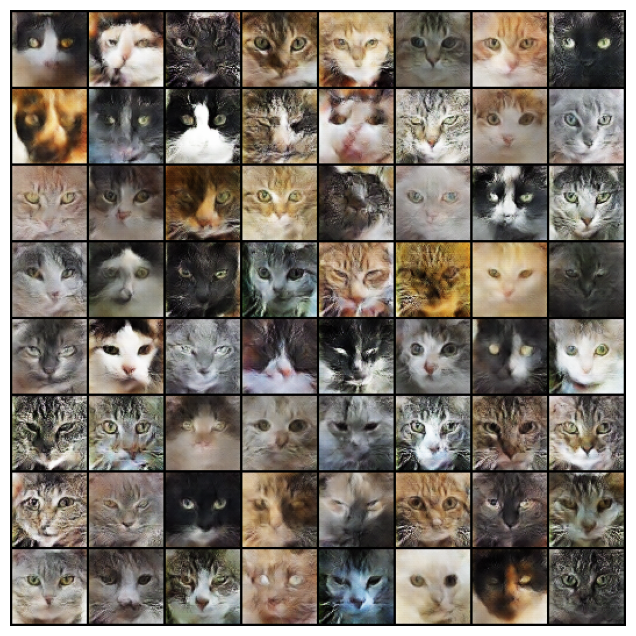

In [134]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

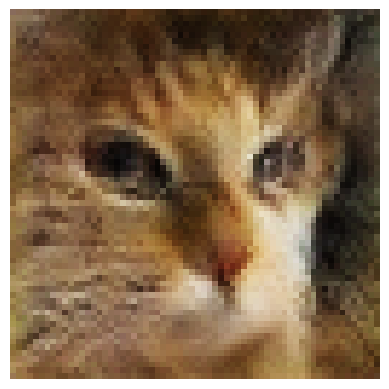

In [142]:
netG.eval()

noise = torch.randn(1, nz, 1, 1, device=device)

# Generate fake cat image
with torch.no_grad():
    fake_cat = netG(noise).detach().cpu().numpy()

# Reshape the image array
fake_cat = np.transpose(fake_cat, (0, 2, 3, 1))
fake_cat = 0.5 * (fake_cat + 1)  # Denormalize the image

# Display the generated cat image
plt.imshow(fake_cat[0])
plt.axis('off')
plt.show()


netG.eval(): This line sets the generator (netG) to evaluation mode. This is important because it disables certain layers, such as dropout and batch normalization, that behave differently during training and evaluation.

noise = torch.randn(1, nz, 1, 1, device=device): This line generates random noise using the torch.randn function. The noise tensor is of size (1, nz, 1, 1), where nz is the size of the generator's input noise vector.

with torch.no_grad():: This is a context manager that disables gradient calculation. It ensures that the operations inside the block do not contribute to the computation of gradients, saving memory and computation.

fake_cat = netG(noise).detach().cpu().numpy(): This line generates the fake cat image by passing the noise tensor through the generator (netG). The detach() method is used to detach the generated image tensor from the computational graph, preventing any further gradient computations. Finally, the image tensor is moved to the CPU and converted to a NumPy array using .cpu().numpy().

fake_cat = np.transpose(fake_cat, (0, 2, 3, 1)): The generated image tensor has a shape of (1, 3, 64, 64) (assuming RGB images with a size of 64x64 pixels). This line transposes the dimensions of the tensor to (1, 64, 64, 3) to match the usual image format.

fake_cat = 0.5 * (fake_cat + 1): The generator outputs images in the range of [-1, 1]. This line rescales the pixel values to the range [0, 1] by adding 1 to each pixel value and then dividing by 2.

plt.imshow(fake_cat[0]): This line uses plt.imshow to display the generated cat image. Since the fake_cat array has a shape of (1, 64, 64, 3), we access the first (and only) image in the array using fake_cat[0].

plt.axis('off'): This line turns off the axis labels and ticks in the plot.

plt.show(): This line displays the plot with the generated cat image.

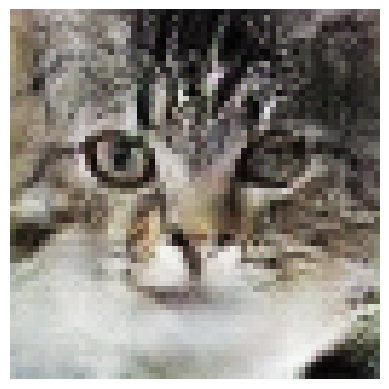

In [141]:
# Set the generator to evaluation mode
netG.eval()

# Generate random noise vector
noise = torch.randn(1, nz, 1, 1, device=device)

# Generate fake cat image
with torch.no_grad():
    fake_cat = netG(noise).detach().cpu().numpy()

# Reshape the image array
fake_cat = np.transpose(fake_cat, (0, 2, 3, 1))
fake_cat = 0.5 * (fake_cat + 1)  # Denormalize the image

# Display the generated cat image
plt.imshow(fake_cat[0])
plt.axis('off')
plt.show()
